# Plotting teams exploration of tradespace over the theoretical traedspace

In [7]:
import os.path
from scipy.io import loadmat
import csv

ANALYTICAL_TRADESPAVCE_FILE = os.path.expanduser("~/Learning2019Data/AnalyticalTradespace/data-2020-Mar-26.csv")
fp = open(ANALYTICAL_TRADESPAVCE_FILE, "r")
csvreader = csv.DictReader(fp)

timeCampus       = list()
totalCost        = list()
interactionScore = list()
diversityScore   = list()

for data_row in csvreader:
    timeCampus.append       (float(data_row["walking_time"]))
    totalCost.append        (float(data_row["cost"])/1e6)
    interactionScore.append (float(data_row["interaction_score"]))
    diversityScore.append   (float(data_row["team_mix"]))

fp.close()

Now plotting the theoretical tradespace data only to check for consistency with MATLAB plots

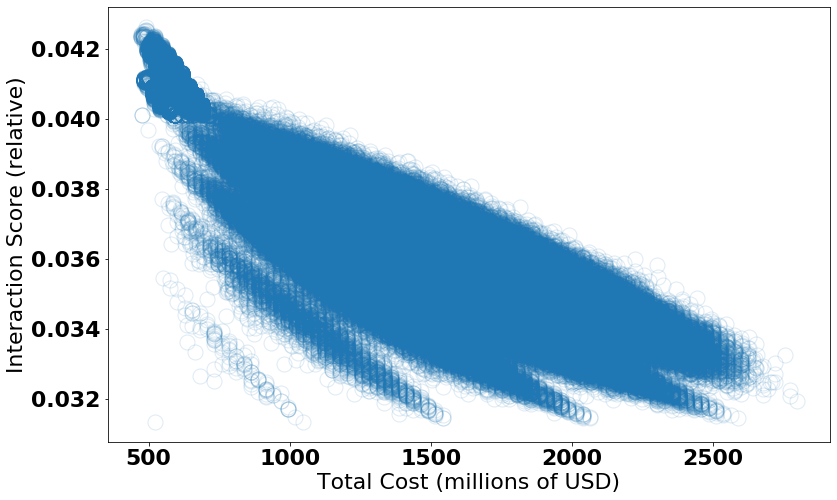

In [8]:
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import numpy as np


font = {'family' : 'DejaVu Sans',
        'weight' : 'bold',
        'size'   : 22}

matplotlib.rc('font', **font)

GOLDEN_RATIO = np.array([1.61803398875, 1])
plt.figure(figsize=GOLDEN_RATIO*8)

plt.plot(totalCost, interactionScore, marker="o", linewidth=0, markersize=15, fillstyle='none', alpha=0.15)
plt.xlabel ('Total Cost (millions of USD)')
plt.ylabel ('Interaction Score (relative)')
plt.show()

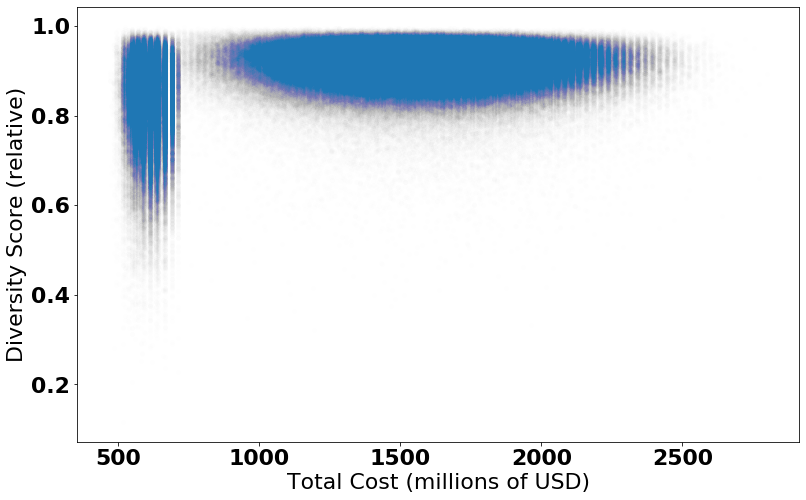

In [9]:
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import numpy as np


font = {'family' : 'DejaVu Sans',
        'weight' : 'bold',
        'size'   : 22}

matplotlib.rc('font', **font)

GOLDEN_RATIO = np.array([1.61803398875, 1])
plt.figure(figsize=GOLDEN_RATIO*8)

plt.plot(totalCost, diversityScore, marker="o", markeredgewidth=0,
         linewidth=0, markersize=5, fillstyle='full', alpha=0.005)
plt.xlabel ('Total Cost (millions of USD)')
plt.ylabel ('Diversity Score (relative)')
plt.show()

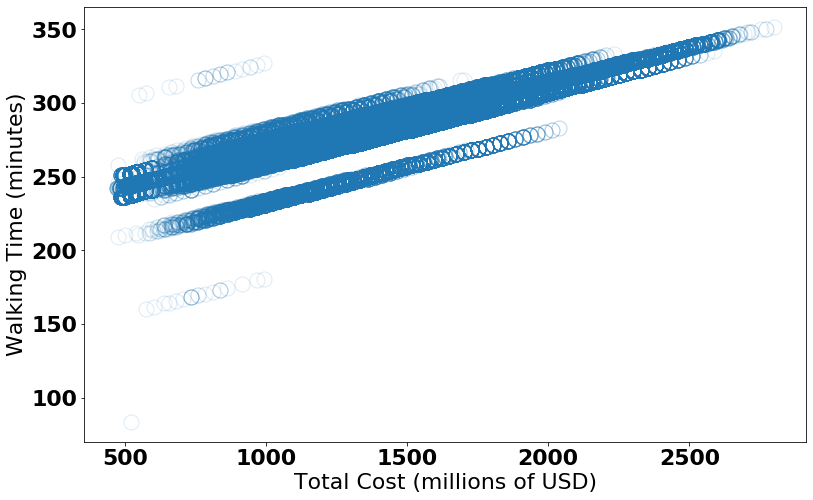

In [10]:
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import numpy as np


font = {'family' : 'DejaVu Sans',
        'weight' : 'bold',
        'size'   : 22}

matplotlib.rc('font', **font)

GOLDEN_RATIO = np.array([1.61803398875, 1])
plt.figure(figsize=GOLDEN_RATIO*8)

plt.plot(totalCost, timeCampus, marker="o", linewidth=0, markersize=15, fillstyle='none', alpha=0.15)
plt.xlabel ('Total Cost (millions of USD)')
plt.ylabel ('Walking Time (minutes)')
plt.show()

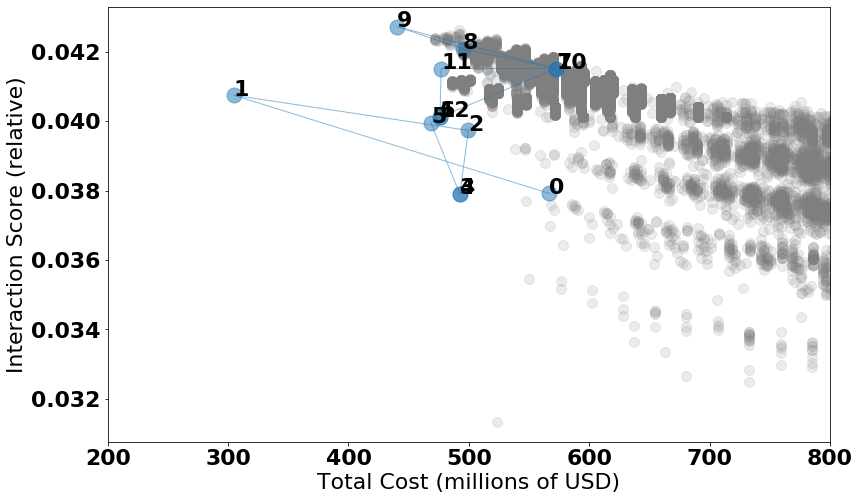

In [16]:
import sys
sys.path.append("../CommonModules") # go to parent dir/CommonModules

import Learning2019GTL.Globals as Globals
import Learning2019GTL.DataConnector as DataConnector

team = DataConnector.Team()
ui_events = team.getSimulationUIEventsByTeamID(3)

team_cost        = list()
team_interaction = list()
for event in ui_events:
    team_cost.append(event.total_cost)
    team_interaction.append(event.interaction_score)

team_cost        = np.array(team_cost)
team_interaction = np.array(team_interaction)
    
plt.figure(figsize=GOLDEN_RATIO*8)

plt.plot(totalCost, interactionScore, marker="o", linewidth=0, markersize=10, alpha=0.15, color='#7f7f7f')
plt.plot(team_cost, team_interaction/100.0, marker="o", linewidth=1, markersize=15, alpha=0.5)
plt.xlim([200, 800])
for i in range(len(team_cost)):
    #print(f'{i}')
    plt.text(team_cost[i], team_interaction[i]/100.0, f'{i}')
plt.xlabel ('Total Cost (millions of USD)')
plt.ylabel ('Interaction Score (relative)')
plt.show()

/Users/prakash/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


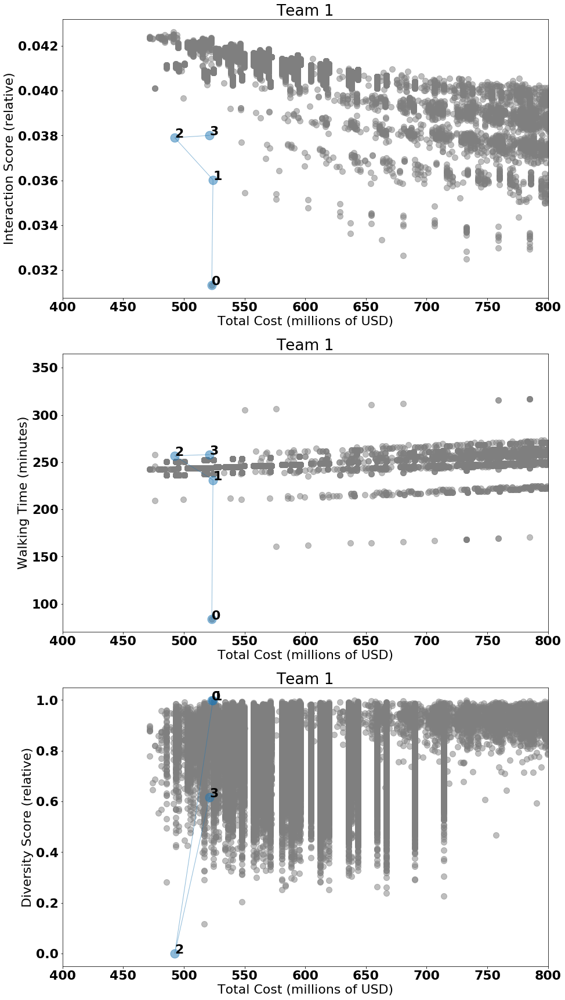

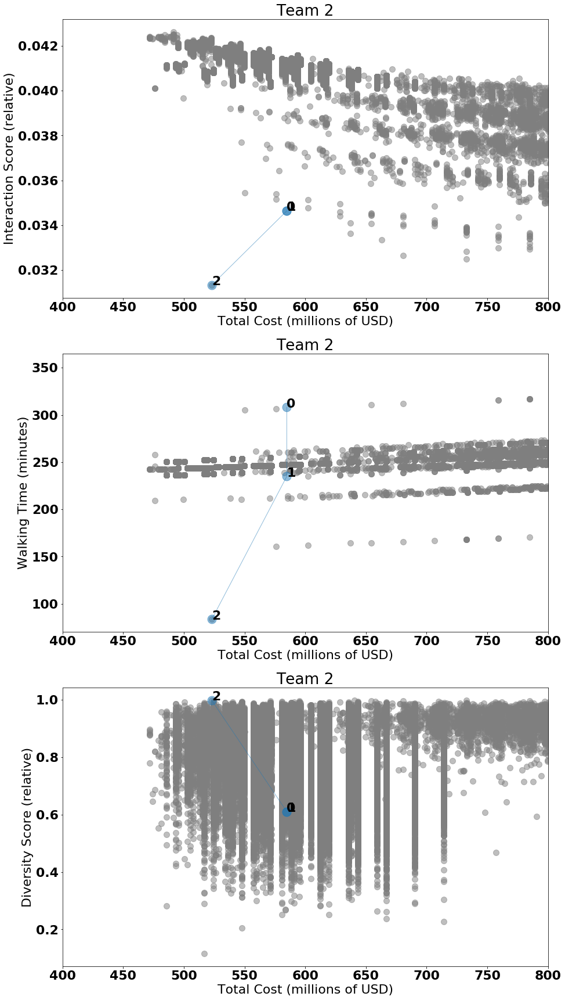

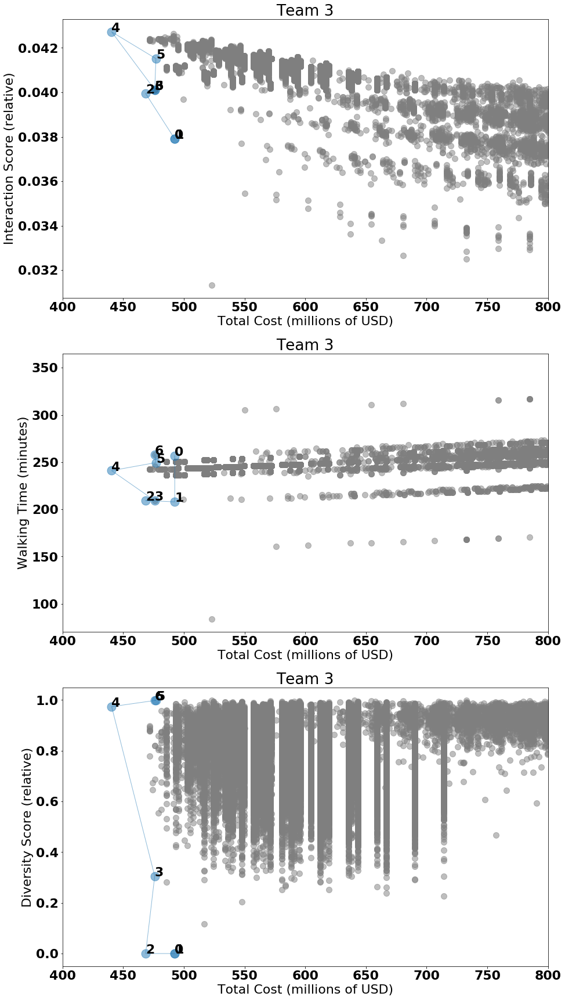

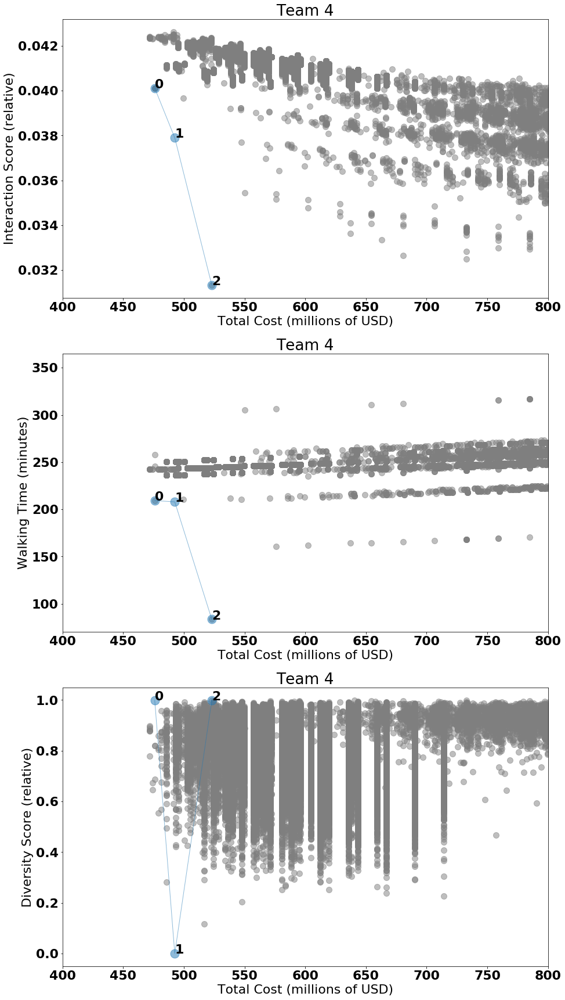

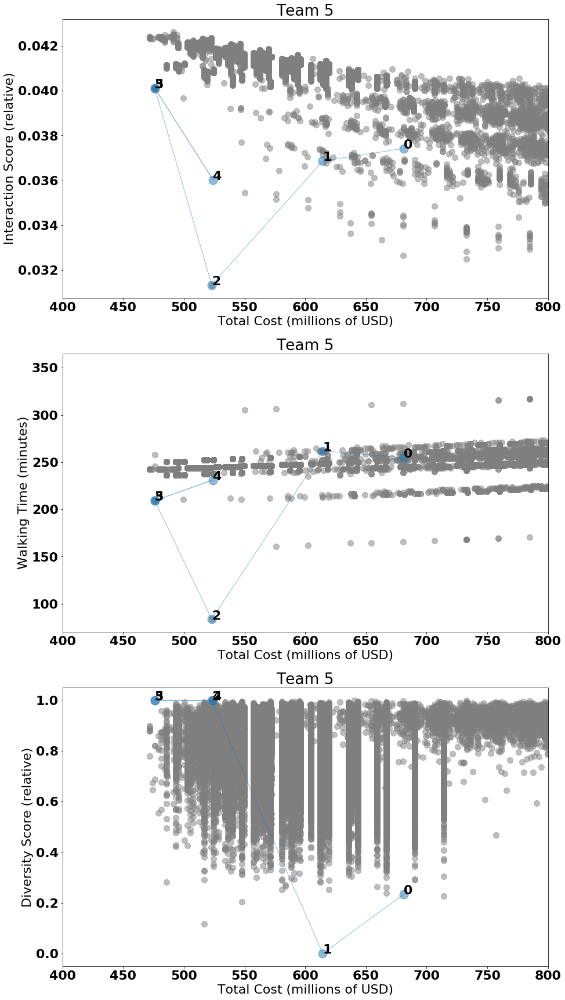

...

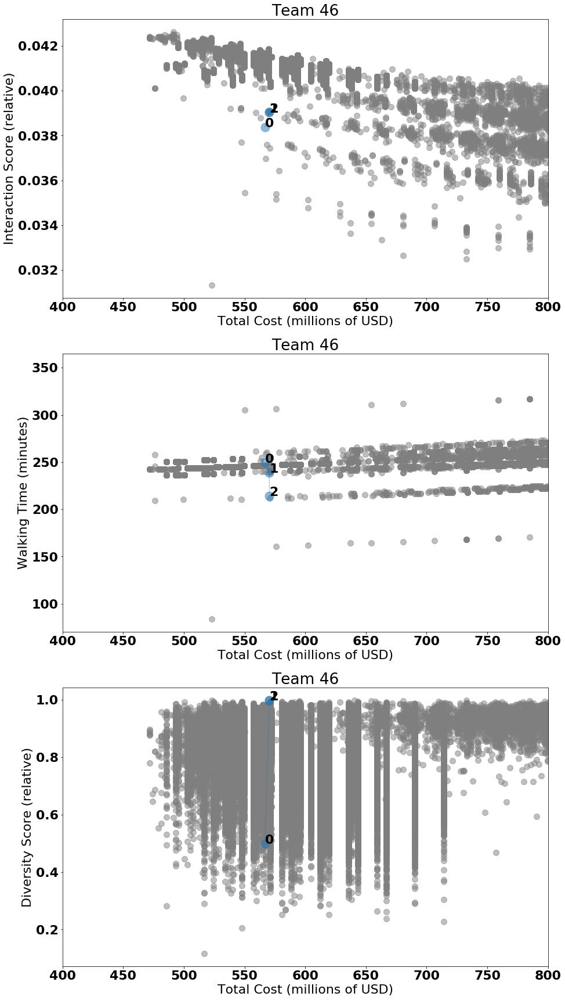

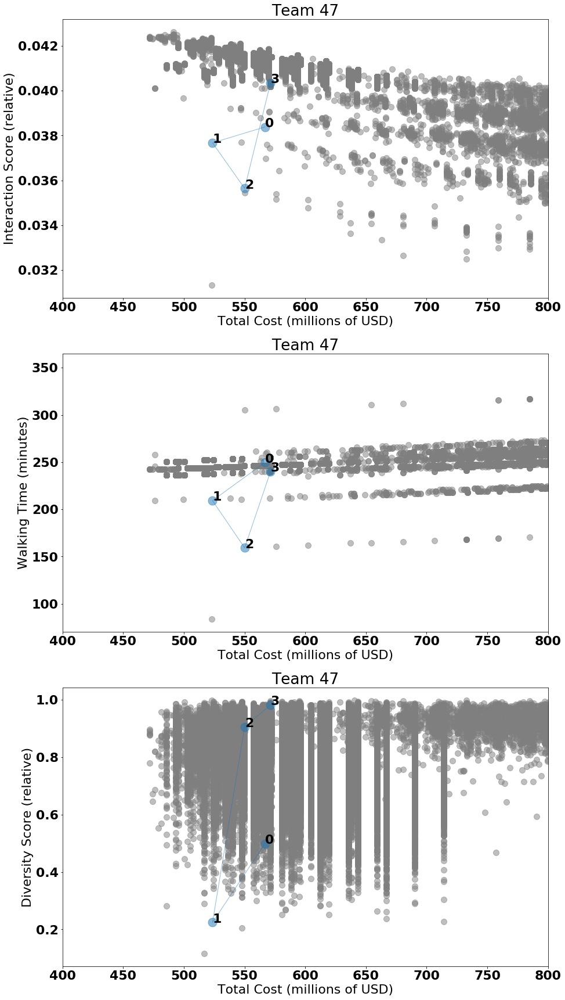

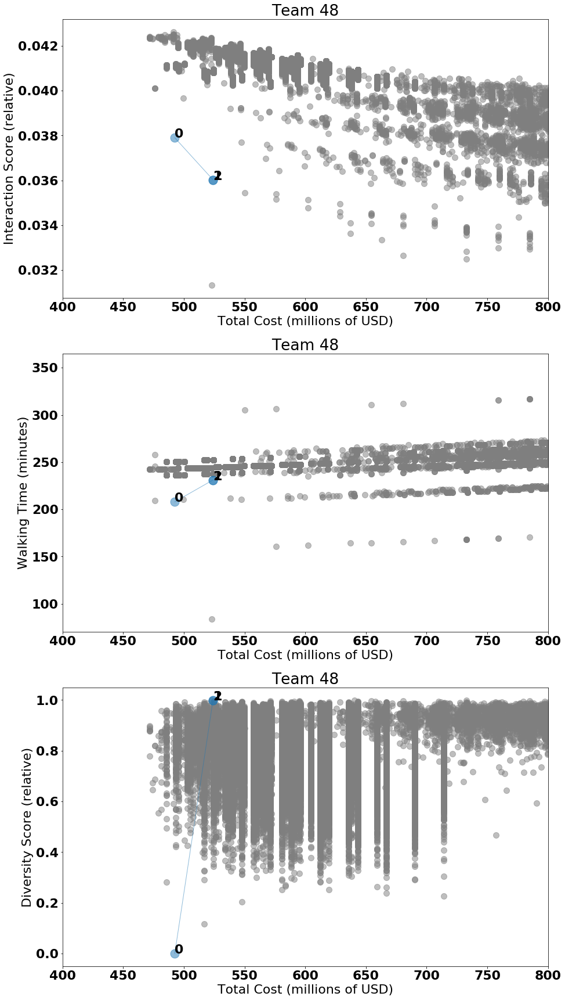

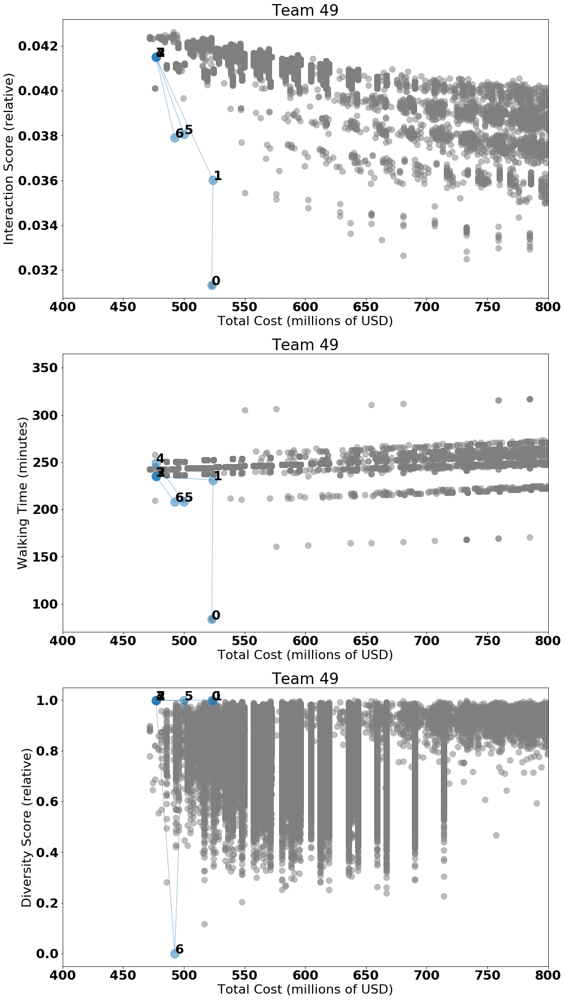

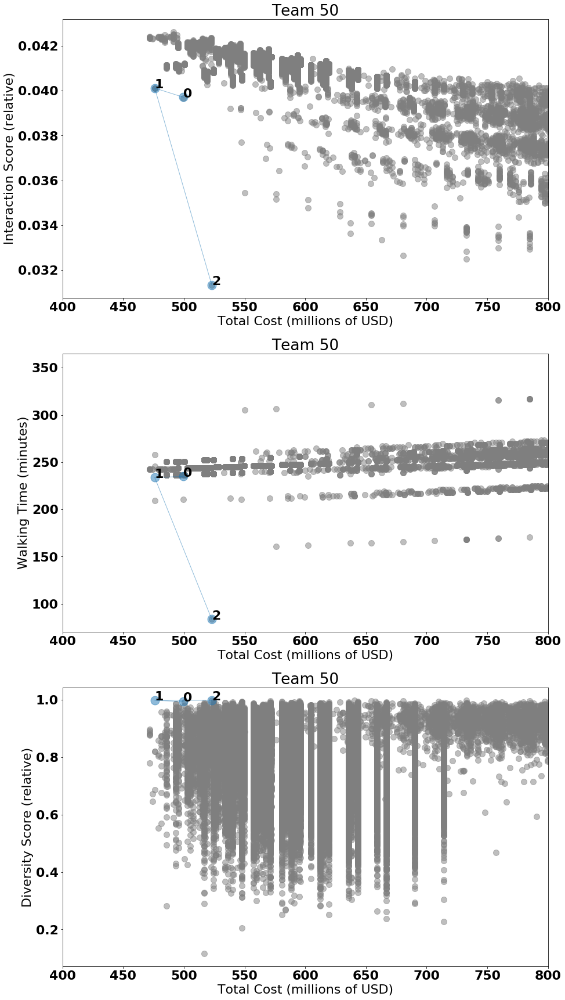

In [19]:
import sys
sys.path.append("../CommonModules") # go to parent dir/CommonModules

import Learning2019GTL.Globals as Globals
import Learning2019GTL.DataConnector as DataConnector

def plotTradespacePanel(team_id):
    TOTAL_POPULATION = 10000
    MIN_DENSITY = 100
    XLIM = [400, 800]
    team = DataConnector.Team()
    ui_events = team.getSimulationUIEventsByTeamID_TotalPopulationDensityConstraint(
        team_id, TOTAL_POPULATION, MIN_DENSITY)

    team_cost        = list()
    team_interaction = list()
    team_walkingtime = list()
    team_diversity   = list()

    for event in ui_events:
        team_cost.append(event.total_cost)
        team_interaction.append(event.interaction_score/100.0)
        team_walkingtime.append(event.walking_time)
        team_diversity.append(event.diversity_score/100.0)

    team_cost        = np.array(team_cost)
    team_interaction = np.array(team_interaction)

    plt.figure(figsize=[15, 30])
    plt.subplot(311)
    plt.plot(totalCost, interactionScore, marker="o", linewidth=0, markersize=10, alpha=0.5, color='#7f7f7f')
    plt.plot(team_cost, team_interaction, marker="o", linewidth=1, markersize=15, alpha=0.5)
    plt.xlim(XLIM)
    for i in range(len(team_cost)):
        #print(f'{i}')
        plt.text(team_cost[i], team_interaction[i], f'{i}')
    plt.title  (f'Team {team_id}')
    plt.xlabel ('Total Cost (millions of USD)')
    plt.ylabel ('Interaction Score (relative)')
    plt.subplot(312)

    plt.plot(totalCost, timeCampus, marker="o", linewidth=0, markersize=10, alpha=0.5, color='#7f7f7f')
    plt.plot(team_cost, team_walkingtime, marker="o", linewidth=1, markersize=15, alpha=0.5)
    plt.xlim(XLIM)
    for i in range(len(team_cost)):
        #print(f'{i}')
        plt.text(team_cost[i], team_walkingtime[i], f'{i}')
    plt.xlabel ('Total Cost (millions of USD)')
    plt.ylabel ('Walking Time (minutes)')
    plt.title  (f'Team {team_id}')
    
    plt.subplot(313)
    plt.plot(totalCost, diversityScore, marker="o", linewidth=0, markersize=10, alpha=0.5, color='#7f7f7f')
    plt.plot(team_cost, team_diversity, marker="o", linewidth=1, markersize=15, alpha=0.5)
    plt.xlim(XLIM)
    for i in range(len(team_cost)):
        #print(f'{i}')
        plt.text(team_cost[i], team_diversity[i], f'{i}')
    plt.xlabel ('Total Cost (millions of USD)')
    plt.ylabel ('Diversity Score (relative)')
    plt.title  (f'Team {team_id}')
    save_fpath = os.path.expanduser(f"~/Learning2019Data/tradespace-2020-Mar-26_2d-zoom_out/Team_{team_id:02d}.jpg")
    plt.savefig(save_fpath)
    #plt.show()
    
for tid in range(1, 51):
    plotTradespacePanel(tid)

In [8]:
len(timeCampus)

381779